In [4]:
import os
import glob
import cv2
import numpy as np
import torch
from google.colab.patches import cv2_imshow

In [5]:
!git clone https://github.com/xinntao/ESRGAN

fatal: destination path 'ESRGAN' already exists and is not an empty directory.


In [6]:
%cd ESRGAN

/content/ESRGAN


In [7]:
import RRDBNet_arch as arch

Models: https://drive.google.com/drive/u/0/folders/17VYV_SoZZesU6mbxz2dMAIccSSlqLecY

In [8]:
model_name = 'RRDB_ESRGAN_x4.pth' #'RRDB_PSNR_x4.pth'
models_dir = 'models/'

In [9]:
environment = 'cuda'
device = torch.device(environment)

In [10]:
!nvidia-smi

Tue Feb 13 15:41:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [11]:
import gdown

In [13]:
model_1 = '{}RRDB_ESRGAN_x4.pth'.format(models_dir)
model_2 = '{}RRDB_PSNR_x4.pth'.format(models_dir)

In [ ]:
gdown.download('https://drive.google.com/file/d/1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene/view?usp=drive_link', model_1)
gdown.download('https://drive.google.com/file/d/1pJ_T-V1dpb1ewoEra1TGSWl5e6H7M4NN/view?usp=drive_link', model_2)

In [15]:
def load_model(model_name, model_dir, device):
  model_path = "{}{}".format(model_dir, model_name)
  model = arch.RRDBNet(3, 3, 64, 23, gc = 32)
  model.load_state_dict(torch.load(model_path), strict = True)
  model.eval()
  model = model.to(device)
  return model

In [16]:
model = load_model(model_name, models_dir, device)

In [26]:
images_dir = '/content/ESRGAN/LR/'

In [27]:
name_img = '{}comic.png'.format(images_dir)
name_img

'/content/ESRGAN/LR/comic.png'

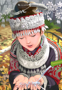

In [28]:
img = cv2.imread(name_img)
cv2_imshow(img)

In [31]:
img.shape

(90, 62, 3)

SUPER RESOLUTION

In [29]:
def super_resolution(path_img, device, model):
  base = os.path.splitext(os.path.basename(path_img))[0]
  #print(base)
  img = cv2.imread(path_img)
  img = img * 1.0 / 255
  #print(img.shape)
  img = torch.from_numpy(np.transpose(img[:,:, [2,1,0]], (2,0,1))).float()
  #print(img.shape)
  LR = img.unsqueeze(0)
  #print(LR.shape)
  LR = LR.to(device)

  with torch.no_grad():
    result = model(LR).data.squeeze().float().cpu().clamp_(0, 1).numpy()
  result = np.transpose(result[[2,1,0], :, :], (1,2,0))
  result = (result * 255.0).round()
  cv2.imwrite('results/{:s}_sr.png'.format(base), result)
  return result

(360, 248, 3)


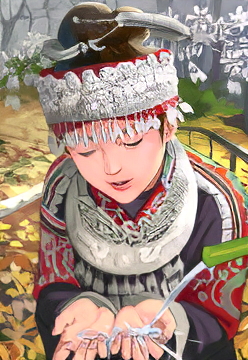

In [30]:
result_sr = super_resolution(name_img, device, model)
print(result_sr.shape)
cv2_imshow(result_sr)

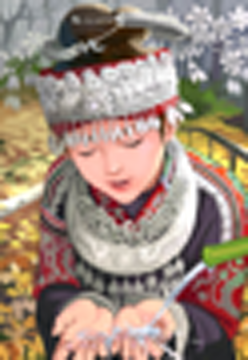

In [32]:
img = cv2.imread(name_img)
bicubic_result = cv2.resize(img, (0,0), fx = 4.0, fy = 4.0, interpolation=cv2.INTER_CUBIC)
cv2_imshow(bicubic_result)

### PSNR

Peak Single to Noise Ratio ([PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio)) is one of the most used metrics to measure the quality of reconstruction compressed images

(360, 248, 3)


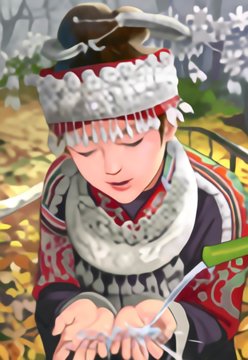

In [33]:
model_name = 'RRDB_PSNR_x4.pth'
model = load_model(model_name, models_dir, device)
result_sr = super_resolution(name_img, device, model)
print(result_sr.shape)
cv2_imshow(result_sr)

(180, 124, 3)


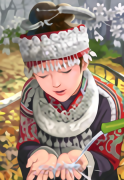

In [34]:
result_small = cv2.resize(result_sr, (0,0), fx = 0.5, fy = 0.5)
print(result_small.shape)
cv2_imshow(result_small)

In [35]:
# MULTI IMAGES
directory = '/content/ESRGAN/LR/*'

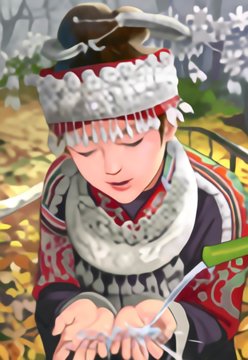

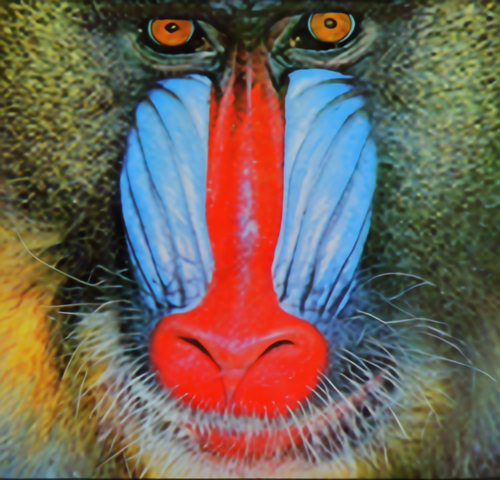

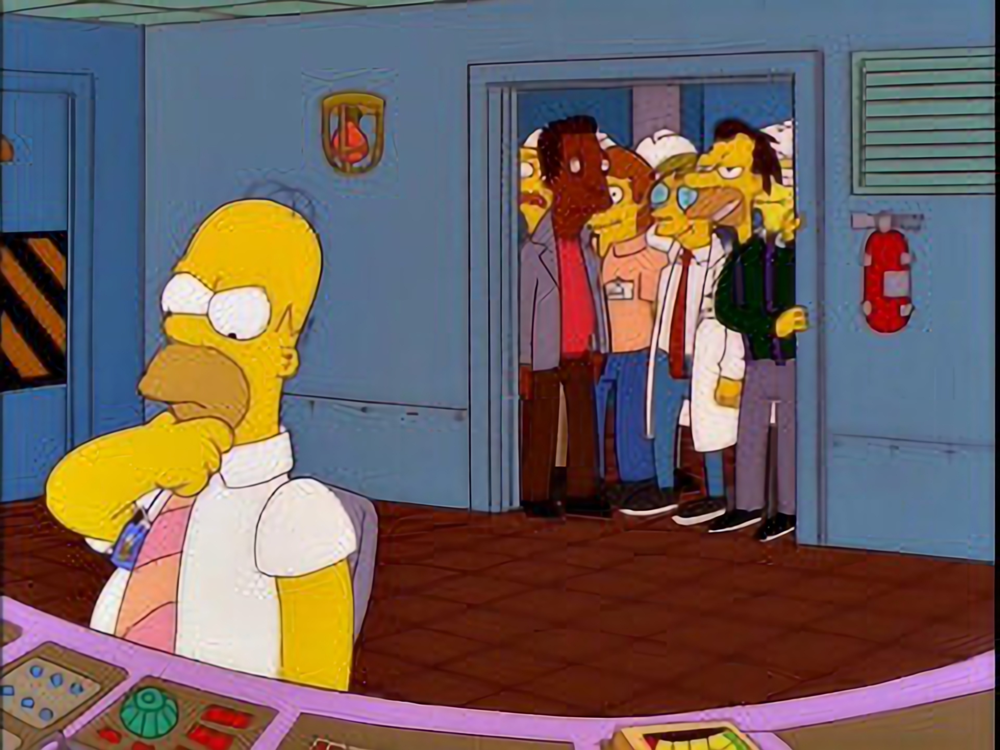

In [39]:
for image in glob.glob(directory):
  result_sr = super_resolution(image, device, model)
  cv2_imshow(result_sr)

Improving the Results

In [40]:
!git clone https://github.com/xinntao/Real-ESRGAN.git

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 755, done.
remote: Total 755 (delta 0), reused 0 (delta 0), pack-reused 755
Receiving objects: 100% (755/755), 5.38 MiB | 20.05 MiB/s, done.
Resolving deltas: 100% (406/406), done.


In [41]:
%cd Real-ESRGAN/

/content/ESRGAN/Real-ESRGAN


In [ ]:
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

## Super resolution

> Parameter 1: model

Available models:

* RealESRGAN_x4plus (default)
* RealESRNet_x4plus
* RealESRGAN_x4plus_anime_6B
* RealESRGAN_x2plus
* realesr-animevideov3
* realesr-general-x4v3

> Parameter 2: folder where the images are

> Parameter 3: how much it will be increased



In [43]:
!python inference_realesrgan.py -n RealESRGAN_x4plus -i ../LR --outscale 4

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
Downloading: "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth" to /content/ESRGAN/Real-ESRGAN/weights/RealESRGAN_x4plus.pth

100% 63.9M/63.9M [00:00<00:00, 219MB/s]
Testing 0 baboon
Testing 1 comic
Testing 2 simpson
Error CUDA out of memory. Tried to allocate 1.32 GiB. GPU 0 has a total capacty of 14.75 GiB of which 507.06 MiB is free. Process 13074 has 12.23 GiB memory in use. Process 295419 has 2.02 GiB memory in use. Of the allocated memory 1.77 GiB is allocated by PyTorch, and 127.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_

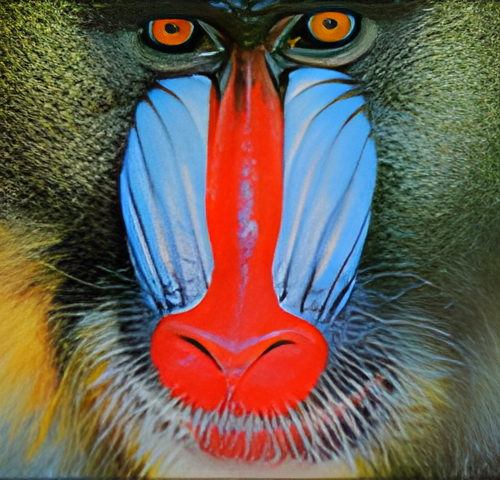

In [47]:
result_img = cv2.imread('results/baboon_out.png')
cv2_imshow(result_img)

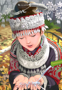

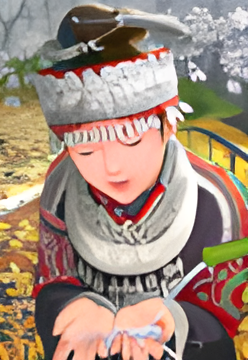

In [48]:
original_img = cv2.imread('../LR/comic.png')
result_img = cv2.imread('results/comic_out.png')
cv2_imshow(original_img)
cv2_imshow(result_img)